# Imports and Paths

In [1]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import cartopy
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.patches import ConnectionPatch
import xarray as xr
from astropy.convolution import convolve
from scipy.ndimage import maximum_filter
from sklearn.neighbors import KDTree

In [2]:
from palettable.cartocolors.qualitative import Prism_8
prism = Prism_8.mpl_colors
blue = prism[1]
green = prism[3]
purple = prism[0]
red = prism[7]
orange = prism[6]
yellow = prism[5]
gray = '#303039'


from palettable.cartocolors.sequential import agSunset_4
sunset = ['#E69C3E',#'#D69A39',
            '#BB321C',#'#C4664A',
            '#7A7087',
            '#8BAECC',#'#78979A'
            ]

#importing plotting parameters
style = '/home/gleung/scripts/styles/bee-paperlight.mplstyle'
plt.style.use(style)

import matplotlib.font_manager as font_manager
from matplotlib import rcParams

# Add every font at the specified location
font_dir = ['/home/gleung/scripts/futura']
for font in font_manager.findSystemFonts(font_dir):
    font_manager.fontManager.addfont(font)

# Set font family globally
rcParams['font.family'] = 'Futura'
rcParams['figure.dpi'] = 500  
rcParams['pdf.fonttype'] = 42

bg = 'white'
lcol = 'black'

In [3]:
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER

def add_latlon(ax, grid=False,lats=None, lons = None):
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,ylocs=lats,xlocs=lons,
                        linewidth=0.5,color='black')
    gl.top_labels = False
    gl.right_labels = False
    gl.xlines = grid
    gl.ylines = grid
    gl.xformatter = LONGITUDE_FORMATTER
    gl.yformatter = LATITUDE_FORMATTER

In [4]:
figPath = '/moonbow/gleung/satlcc-figures/paper/'

for path in [figPath]:
    if not os.path.isdir(path):
        os.mkdir(path)

# Figure 1. Map of Forest Loss

In [48]:
anaPath = '/moonbow/gleung/satlcc/GFC_processing/'
forest = np.load(f"{anaPath}forestcover1km_{str(0).zfill(2)}N_{str(120).zfill(3)}E.pkl.npy")

/tmp/ipykernel_48067/1842701421.py:60: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.savefig(f"{figPath}fig1_forestcover.pdf")
feat NOT subset; don't know how to subset; dropped
fond NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
morx NOT subset; don't know how to subset; dropped
/home/gleung/miniconda3/envs/satlcc/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


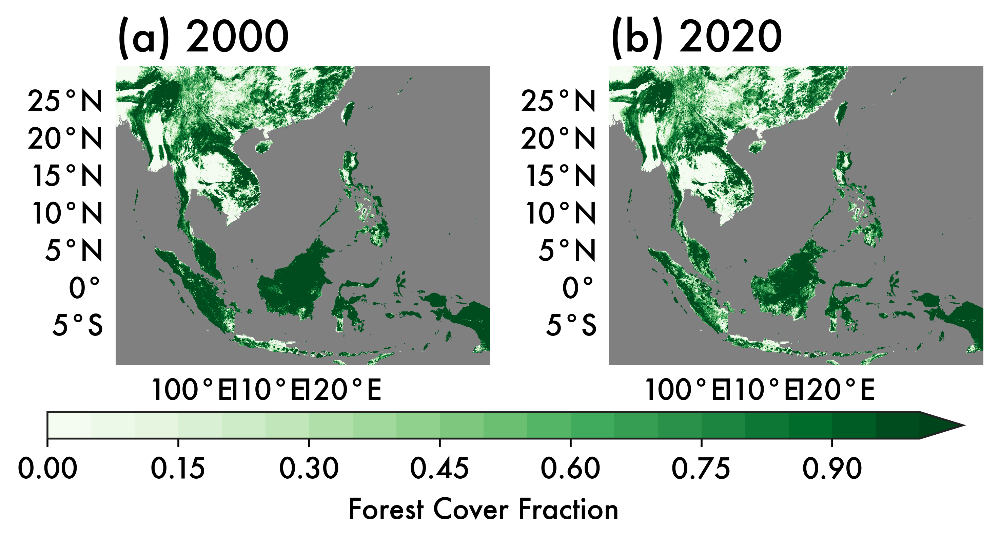

In [6]:
fig, axes = plt.subplots(1,2,sharex=True,sharey=True,figsize=(6,4.5),
                        subplot_kw={'projection':ccrs.PlateCarree()})
axes = axes.flatten()

for ax in axes:
    ax.add_feature(cfeature.NaturalEarthFeature('physical',
                                                'ocean', 
                                                '50m', 
                                                edgecolor=None, 
                                                facecolor='gray'))
    ax.add_feature(cfeature.NaturalEarthFeature('physical',
                                                'land', 
                                                '50m', 
                                                edgecolor=None, 
                                                facecolor='#F2F7FF'),
                                                zorder=0)

for lat in np.arange(0,40,10):
    if lat<0:
        ns = 'S'
        lat_name = -lat
    else:
        ns = 'N'
        lat_name = lat

    for lon in np.arange(90,140,10):
        if lon<0:
            ew = 'W'
            lon_name = -lon
        else:
            ew = 'E'
            lon_name = lon

        lats = np.linspace(lat-10, lat, forest.shape[0]+1)[1:]
        lons = np.linspace(lon, lon+10, forest.shape[1]+1)[:-1]
        
        path = f"{anaPath}forestcover_{str(lat_name).zfill(2)}{ns}_{str(lon_name).zfill(3)}{ew}.npy"
        forest = np.load(path)

        for ax,yr in zip(axes,[0,20]):
            c = ax.contourf(lons, lats,
                          forest[:,:,yr],
                            levels = np.linspace(0,1,21),
                            extend='max',
                            cmap='Greens')
            

for a, ax,yr in zip(['a','b'],axes,[0,20]):
    add_latlon(ax)

    ax.set_title(f"({a}) 20{str(yr).zfill(2)}",loc='left')
    ax.axis('off')

cax = fig.add_axes([axes[0].get_position().x0,
                    axes[1].get_position().y0-0.075, 
                    axes[-1].get_position().x1 - axes[0].get_position().x0,
                    0.035])
cbar = plt.colorbar(c,cax=cax, orientation='horizontal', 
                    label = 'Forest Cover Fraction'
                   ) 
plt.savefig(f"{figPath}fig1_forestcover.pdf")
plt.show()

/tmp/ipykernel_15494/2261234330.py:80: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.savefig(f"{figPath}fig1_forestcover_withdiff.png")
/home/gleung/miniconda3/envs/satlcc/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


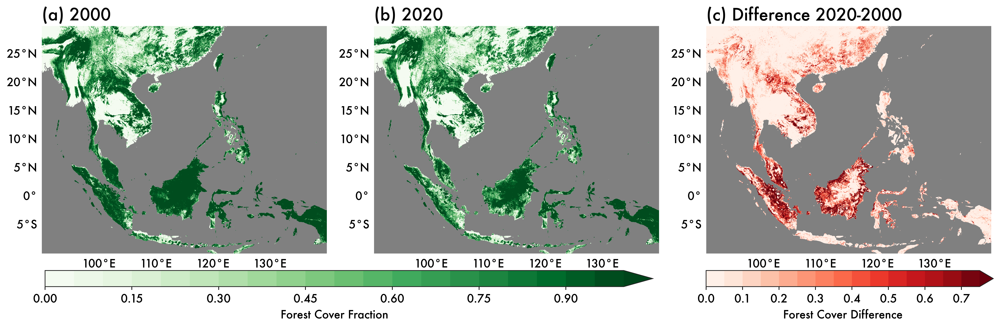

In [49]:
fig, axes = plt.subplots(1,3,sharex=True,sharey=True,figsize=(15,6),
                        subplot_kw={'projection':ccrs.PlateCarree()})
axes = axes.flatten()

for ax in axes:
    ax.add_feature(cfeature.NaturalEarthFeature('physical',
                                                'ocean', 
                                                '50m', 
                                                edgecolor=None, 
                                                facecolor='gray'))
    ax.add_feature(cfeature.NaturalEarthFeature('physical',
                                                'land', 
                                                '50m', 
                                                edgecolor=None, 
                                                facecolor='#F2F7FF'),
                                                zorder=0)

for lat in np.arange(0,40,10):
    if lat<0:
        ns = 'S'
        lat_name = -lat
    else:
        ns = 'N'
        lat_name = lat

    for lon in np.arange(90,140,10):
        if lon<0:
            ew = 'W'
            lon_name = -lon
        else:
            ew = 'E'
            lon_name = lon

        lats = np.linspace(lat-10, lat, forest.shape[0]+1)[1:]
        lons = np.linspace(lon, lon+10, forest.shape[1]+1)[:-1]
        
        path = f"{anaPath}forestcover_{str(lat_name).zfill(2)}{ns}_{str(lon_name).zfill(3)}{ew}.npy"
        forest = np.load(path)

        for ax,yr in zip(axes,[0,20]):
            c = ax.contourf(lons, lats,
                          forest[:,:,yr],
                            levels = np.linspace(0,1,21),
                            extend='max',
                            cmap='Greens')
            
        d = axes[2].contourf(lons, lats,
                          forest[:,:,0]-forest[:,:,20],
                            levels = np.linspace(0,0.75,16),
                            extend='max',
                            cmap='Reds')


for a, ax,yr in zip(['a','b'],axes,[0,20]):
    add_latlon(ax)

    ax.set_title(f"({a}) 20{str(yr).zfill(2)}",loc='left')
    ax.axis('off')

add_latlon(axes[2])
axes[2].set_title(f"(c) Difference 2020-2000",loc='left')
axes[2].axis('off')

cax = fig.add_axes([axes[0].get_position().x0,
                    axes[1].get_position().y0-0.1, 
                    axes[1].get_position().x1 - axes[0].get_position().x0 + 0.02,
                    0.04])
cbar = plt.colorbar(c,cax=cax, orientation='horizontal', 
                    label = 'Forest Cover Fraction'
                   ) 

cax = fig.add_axes([axes[2].get_position().x0+0.02,
                    axes[2].get_position().y0-0.1, 
                    axes[2].get_position().x1 - axes[2].get_position().x0 + 0.02,
                    0.04])
cbar = plt.colorbar(d,cax=cax, orientation='horizontal', 
                    label = 'Forest Cover Difference'
                   ) 

plt.savefig(f"{figPath}fig1_forestcover_withdiff.png")
plt.show()

# Fig 2: Diurnal effect

In [354]:
anaPath = f"/moonbow/gleung/satlcc/deforest_effect/bootstrapped/"

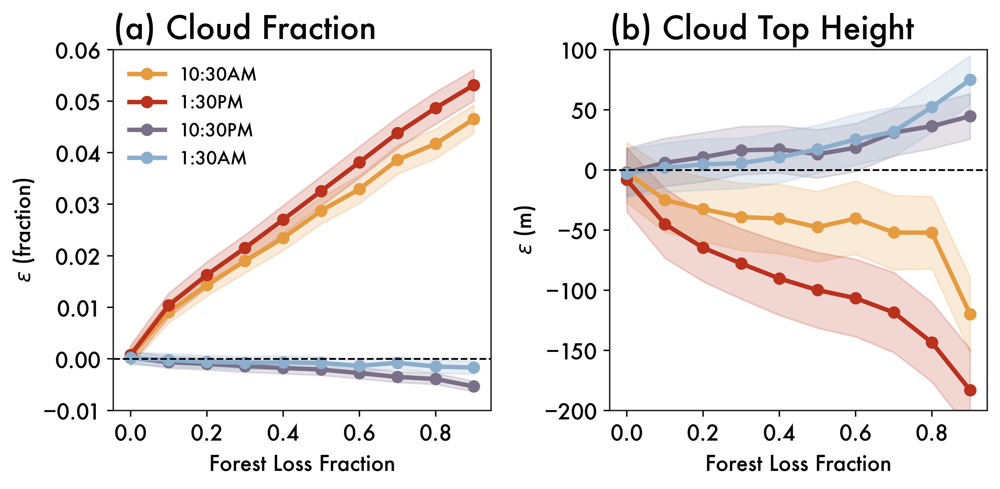

In [355]:
var = 'Loss_1km'

fig, axes = plt.subplots(1,2,figsize=(8,4),sharex=True)
fig.subplots_adjust(wspace=0.2,hspace=0.2)

for name, col, label in zip(['terra_day','aqua_day','terra_night','aqua_night'],sunset,['10:30AM','1:30PM','10:30PM','1:30AM']):
    for ax, v in zip(axes, ['cf','cth']):
        plot = pd.read_csv(f"/moonbow/gleung/satlcc/deforest_effect/bootstrapped/{name}_{v}_{var}.csv",index_col=0)

        ax.plot(plot.index, plot['mean'], marker='o',color=col,label=label)
        ax.fill_between(plot.index,
                                plot.ci25,
                                plot.ci75,
                                alpha=0.2,color=col)
        ax.axhline(0,ls='--',lw=1)

for ax, name,ylab in zip(axes, 
                        [f'(a) Cloud Fraction',f'(b) Cloud Top Height'],
                        ['fraction','m']):
    ax.set_ylabel(f'$\epsilon$ ({ylab})')
    ax.set_xlabel(f'Forest Loss Fraction')
    ax.set_title(name)
    ax.set_rasterized(True)
    
axes[0].set_ylim(-0.01,0.06)
axes[1].set_ylim(-200,100)
axes[0].legend(fontsize=10)

plt.savefig(f"{figPath}/fig3_cloudeffect_diurnal.pdf",dpi=400, bbox_inches='tight')
plt.show()

# Fig 3: Accdg to PWAT

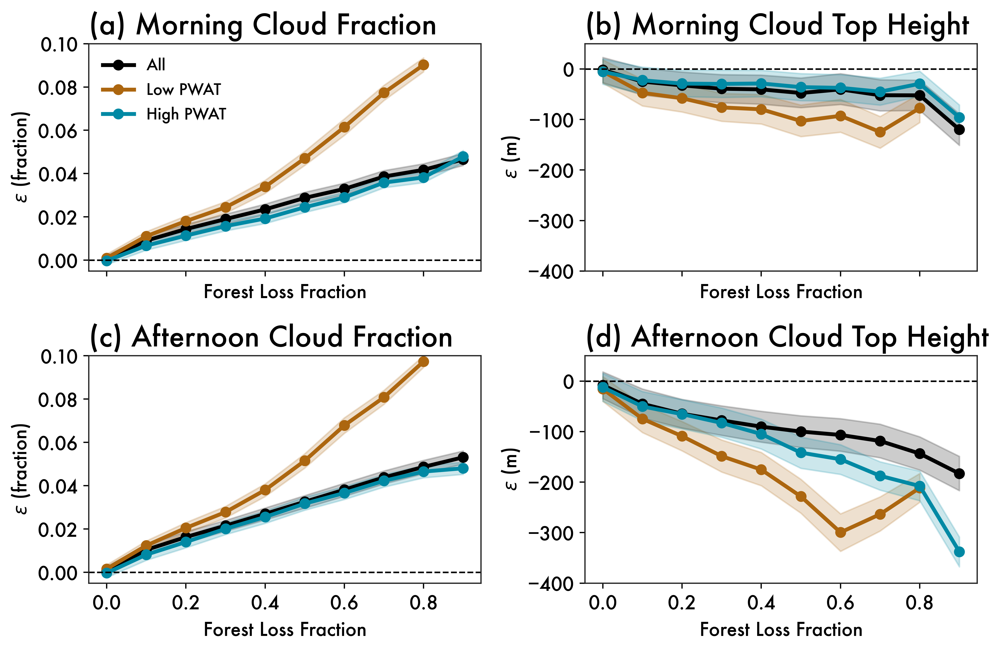

In [54]:
var = 'Loss_1km'
subsetvar = 'pwat'

fig, axess = plt.subplots(2,2,figsize=(9,6),sharex=True,sharey='col')
fig.subplots_adjust(wspace=0.2,hspace=0.2)

for axes, name in zip(axess,['terra_day','aqua_day']):
    for ax, v in zip(axes, ['cf','cth']):
        for val, col,label in zip(['','low_10km','high_10km'],[lcol,'#ac660f','#0089a4'],
                            ['All','Low PWAT','High PWAT']):
            if val!='':
                plot = pd.read_csv(f"/moonbow/gleung/satlcc/deforest_effect/bootstrapped/{name}_{v}_{var}_{subsetvar}_{val}.csv",index_col=0)
            else:
                plot = pd.read_csv(f"/moonbow/gleung/satlcc/deforest_effect/bootstrapped/{name}_{v}_{var}.csv",index_col=0)
            
            ax.plot(plot.index, plot['mean'], marker='o',color=col,label=label)
            ax.fill_between(plot.index,
                                    plot.ci25,
                                    plot.ci75,
                                    alpha=0.2,color=col)
            ax.axhline(0,ls='--',lw=1)

for ax, name,ylab in zip(axess.flatten(), 
                        [f'(a) Morning Cloud Fraction',f'(b) Morning Cloud Top Height',
                        f'(c) Afternoon Cloud Fraction',f'(d) Afternoon Cloud Top Height'],
                        ['fraction','m','fraction','m']):
    ax.set_ylabel(f'$\epsilon$ ({ylab})')
    ax.set_xlabel(f'Forest Loss Fraction')
    ax.set_title(name)
    ax.set_rasterized(True)
    
axes[0].set_ylim(-0.005,0.1)
axes[1].set_ylim(-400,50)
axess[0,0].legend(fontsize=10)

plt.savefig(f"{figPath}/fig4_cloudeffect_bypwat.pdf",dpi=400, bbox_inches='tight')
plt.show()

# Fig 5: Accdg to AOD

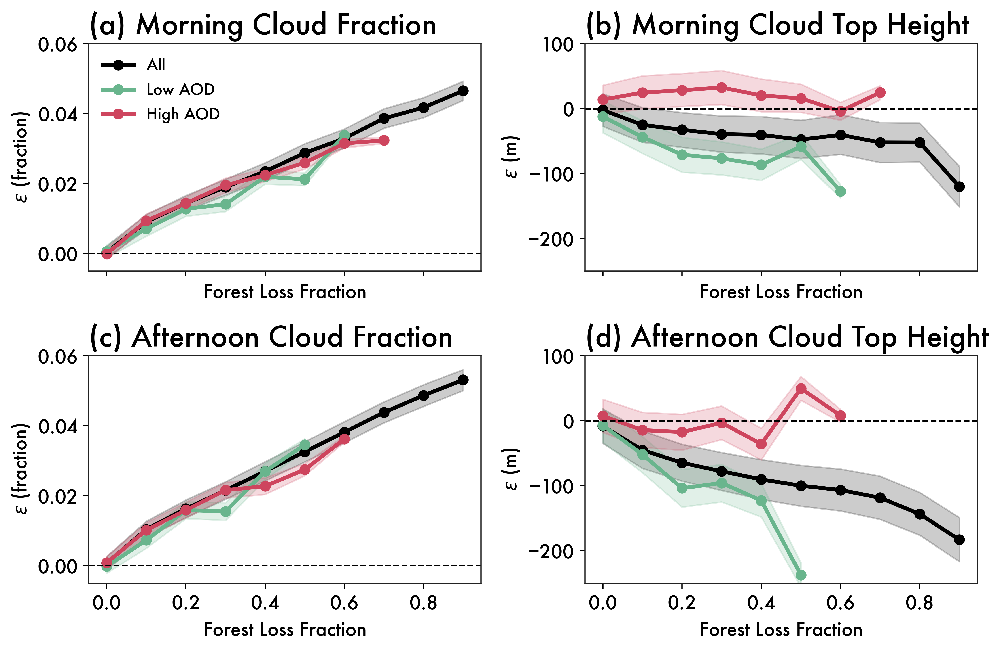

In [53]:
var = 'Loss_1km'
subsetvar = 'aod'

fig, axess = plt.subplots(2,2,figsize=(9,6),sharex=True,sharey='col')
fig.subplots_adjust(wspace=0.2,hspace=0.2)

for axes, name in zip(axess,['terra_day','aqua_day']):
    for ax, v in zip(axes, ['cf','cth']):
        for val, col,label in zip(['','low_10km','high_10km'],[lcol,'#69b58d', '#ce455e'],
                            ['All','Low AOD','High AOD']):
            if val!='':
                plot = pd.read_csv(f"/moonbow/gleung/satlcc/deforest_effect/bootstrapped/{name}_{v}_{var}_{subsetvar}_{val}.csv",index_col=0)
            else:
                plot = pd.read_csv(f"/moonbow/gleung/satlcc/deforest_effect/bootstrapped/{name}_{v}_{var}.csv",index_col=0)
            
            ax.plot(plot.index, plot['mean'], marker='o',color=col,label=label)
            ax.fill_between(plot.index,
                                    plot.ci25,
                                    plot.ci75,
                                    alpha=0.2,color=col)
            ax.axhline(0,ls='--',lw=1)

for ax, name,ylab in zip(axess.flatten(), 
                        [f'(a) Morning Cloud Fraction',f'(b) Morning Cloud Top Height',
                        f'(c) Afternoon Cloud Fraction',f'(d) Afternoon Cloud Top Height'],
                        ['fraction','m','fraction','m']):
    ax.set_ylabel(f'$\epsilon$ ({ylab})')
    ax.set_xlabel(f'Forest Loss Fraction')
    ax.set_title(name)
    ax.set_rasterized(True)
    
axes[0].set_ylim(-0.005,0.06)
axes[1].set_ylim(-250,100)
axess[0,0].legend(fontsize=10)

plt.savefig(f"{figPath}/fig5_cloudeffect_byaod.pdf",dpi=400, bbox_inches='tight')
plt.show()

# Methods

In [5]:
ctrl_col = '#A6ACAF'
ass_col = '#D4AC0D'
def_col = '#A93226'

In [6]:
def mean_within_radius(var,sub,rad=10):
    data = sub.reset_index().pivot(index='level_0',columns='level_1',values=var)
    
    #because the grid is 1km resolution, a distance X km away is just X points
    kernel = np.fromfunction(lambda x, y: ((x-rad)**2 + (y-rad)**2 <= rad**2)*1, 
                             (2*rad+1, 2*rad+1), dtype=int).astype(np.uint8)
    kernel = kernel/np.sum(kernel)

    #doesn't handle nans well
    '''out = scipy.signal.convolve2d(data,kernel, mode='same',
                    boundary='fill',fillvalue=np.nan)'''
    
    #astropy is able to handle nan
    out = convolve(data,kernel,
                   boundary='fill',fill_value=np.nan, 
                   nan_treatment='interpolate',
                   preserve_nan=True)

    temp = pd.DataFrame(data.stack(dropna=False))
    temp.loc[:,f"{var}_{rad}km"] = out.ravel()

    return(temp[f"{var}_{rad}km"])

def max_within_radius(var,sub,rad=10):
    data = sub.reset_index().pivot(index='level_0',columns='level_1',values=var)
    
    #because the grid is 1km resolution, a distance X km away is just X points
    kernel = np.fromfunction(lambda x, y: ((x-rad)**2 + (y-rad)**2 <= rad**2)*1, 
                             (2*rad+1, 2*rad+1), dtype=int).astype(np.uint8)
     
    #substitute nan with 0
    out = maximum_filter(np.nan_to_num(data), footprint=kernel,
                    mode = 'nearest')

    temp = pd.DataFrame(data.stack(dropna=False))
    temp.loc[:,f"{var}_{rad}km_max"] = out.ravel()

    return(temp[f"{var}_{rad}km_max"])

In [7]:
anaPath = '/moonbow/gleung/satlcc/deforest_effect/'
alldata = pd.read_parquet(f"{anaPath}/base_forest_data.pq",engine='pyarrow')

In [10]:
sub = alldata

yr = 4
prior = [f"Loss_{yr}" for yr in range(1,yr+1)]

#subset just the data needed, initial forest cover and loss all years prior to this year
sub = sub[[f"Forest_0"]+ prior]
#calculate total prior loss before this year
sub['PriorLoss'] = sub[prior].sum(axis=1)

/tmp/ipykernel_15405/3546110720.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sub['PriorLoss'] = sub[prior].sum(axis=1)


In [11]:
for var in ['PriorLoss',f"Loss_{yr}"]:
    for dist in [1,10]:
        sub[f"{var}_{dist}km"] = mean_within_radius(var,sub,dist)
    sub[f"{var}_10km_max"] = max_within_radius(var,sub)

/tmp/ipykernel_15405/2695615654.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sub[f"{var}_{dist}km"] = mean_within_radius(var,sub,dist)
/tmp/ipykernel_15405/2695615654.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sub[f"{var}_{dist}km"] = mean_within_radius(var,sub,dist)
/tmp/ipykernel_15405/2695615654.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: htt

In [12]:
#define population of possible control points: 
#(1) high initial forest cover
#(2) low forest loss prior to this year 
#(3) low mean forest loss within 10km radius prior to this year
ctrl = sub[(sub.Forest_0>=0.9) &
            (sub.PriorLoss<=0.02) &
            (sub.PriorLoss_10km<=0.02)]
ctrlpts = np.array(list(ctrl.index.values))

In [74]:
#define population of assessment points:
#any pixel within 10km of a pixel which lost 50% forest cover this year
defo = sub[sub[f"Loss_{yr}_10km_max"]>=0.5]

#remove any assessment pixels which don't have an equivalent control pixel within 25km
#we can't pair them with control pixel so not included in final stats
asspts = np.array(list(defo.index.values))
n =  KDTree(ctrlpts).query_radius(asspts, 25*0.008, count_only=True)
asspts = asspts[n!=0]
assess = defo.loc[list(zip(asspts[:,0],asspts[:,1]))]

defo = assess[assess[f'Loss_{yr}']>=0.5]
defopts = np.array(list(defo.index.values))

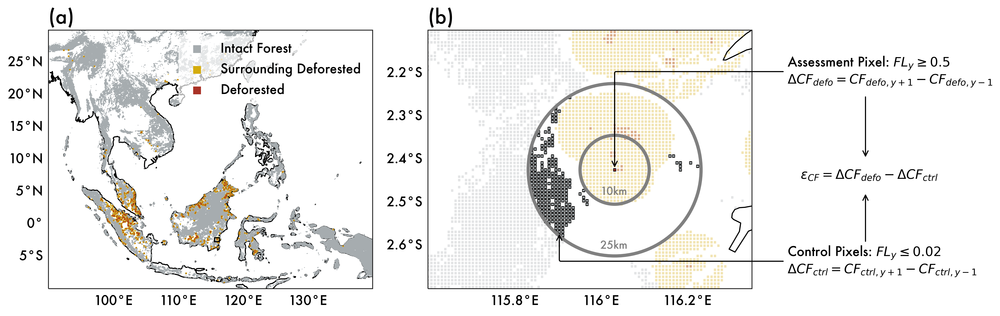

In [93]:
fig, axes = plt.subplots(1,2,
                       figsize=(13,5),
                       subplot_kw={'projection':ccrs.PlateCarree()})

axes[0].set_title('(a)')
axes[1].set_title('(b)')

ax = axes[0]

ax.scatter(ctrlpts[:,1],ctrlpts[:,0],color=ctrl_col, marker='s',s=0.5, label = 'Intact Forest',linewidths=0)
ax.scatter(asspts[:,1],asspts[:,0],color=ass_col, marker='s',s=0.5, label = 'Surrounding Deforested',linewidths=0)
ax.scatter(defopts[:,1],defopts[:,0],color=def_col,marker='s',s=0.5, label = 'Deforested',linewidths=0)

ax.coastlines(color='black',zorder=0)
add_latlon(ax)

ax.set_xlim(90,140)
ax.set_ylim(-10,30)

subx = (115.6,116.35)
suby = (-2.7,-2.1)

ax.legend(loc='upper right',markerscale=10,facecolor='white',edgecolor='white',framealpha=0.7,frameon=True)
ax.plot([subx[0], subx[1], subx[1], subx[0], subx[0]], [suby[0], suby[0], suby[1], suby[1], suby[0]],
         color='black', linewidth=1, 
         transform=ccrs.Geodetic(), 
         )
         
ax = axes[1]

for pts, col in zip([ctrlpts,asspts,defopts],[ctrl_col,ass_col,def_col]):
    pts = pts[(pts[:,0]>=suby[0])&(pts[:,0]<=suby[1])&(pts[:,1]>=subx[0])&(pts[:,1]<=subx[1])]
    ax.scatter(pts[:,1],pts[:,0],color=col,s=4.5,alpha=0.3, marker='s',linewidths=0.1)

i = 2
pos = (defopts[(defopts[:,0]>=suby[0])&(defopts[:,0]<=suby[1])&(defopts[:,1]>=subx[0])&(defopts[:,1]<=subx[1])][i])
ax.scatter(pos[1],pos[0],color=def_col,marker='s',s=5,edgecolors='black',linewidths=0.5)

ctrl_sub = ctrlpts[(abs(ctrlpts[:,0]-pos[0]) <= 25*0.008) & (abs(ctrlpts[:,1]-pos[1]) <= 25*0.008)] #exclude points which are too far in one direction anyway
n =  KDTree(ctrl_sub).query_radius(np.array(list(pos)).reshape(-1,1).T, 25*0.008)
ctrl_sub = ctrl_sub[n[0]]
ctrl_sub = ctrl.loc[list(zip(ctrl_sub[:,0],ctrl_sub[:,1]))]
ctrlpts_ = np.array(list(ctrl_sub.index.values))
ax.scatter(ctrlpts_[:,1],ctrlpts_[:,0],color=ctrl_col,marker='s',s=5,edgecolors='black',linewidths=0.5)

ax.coastlines(color='black',zorder=0)
add_latlon(ax,lons=np.arange(subx[0],subx[1],0.2))

ax.set_xlim(subx)
ax.set_ylim(suby)

arrowprops = dict(
    arrowstyle="->",
    connectionstyle="angle,angleA=0,angleB=90,rad=10")

x_o = 0.4
y_o = 0.2
ax.annotate("Assessment Pixel: $FL_y\geq 0.5$\n$\Delta CF_{defo}=CF_{defo, y+1}-CF_{defo, y-1}$",(pos[1],pos[0]),
            xytext=(pos[1]+x_o,pos[0]+y_o),arrowprops=arrowprops
                )

i=31
ax.annotate("Control Pixels: $FL_y\leq 0.02$\n$\Delta CF_{ctrl}=CF_{ctrl, y+1}-CF_{ctrl, y-1}$",(ctrlpts_[i,1],ctrlpts_[i,0]),
            xytext=(pos[1]+x_o,pos[0]-y_o*1.2),arrowprops=arrowprops
                )

ax.text(1.15, 0.425, '$\epsilon_{CF}=\Delta CF_{defo} - \Delta CF_{ctrl}$', transform=ax.transAxes)
ax.annotate('', xy=(1.35, 0.175), xycoords='axes fraction', xytext=(1.35, 0.375), 
            arrowprops=dict(arrowstyle="<-", color='black'))
ax.annotate('', xy=(1.35, 0.75), xycoords='axes fraction', xytext=(1.35, 0.5), 
            arrowprops=dict(arrowstyle="<-", color='black'))

#distance circle annotations
ax.add_patch(mpatches.Circle(xy=[pos[1], pos[0]], radius=0.008*10, edgecolor='gray', linewidth=3, facecolor='none',transform=ccrs.PlateCarree()))
ax.text(116.03,-2.475,'10km',
        horizontalalignment='center',verticalalignment='center',
        fontsize=10,color='gray')
        
ax.add_patch(mpatches.Circle(xy=[pos[1], pos[0]], radius=0.008*25, edgecolor='gray', linewidth=3, facecolor='none',transform=ccrs.PlateCarree()))
ax.text(116.03,-2.6,'25km',
        horizontalalignment='center',verticalalignment='center',
        fontsize=10,color='gray')

plt.savefig(f"{figPath}/fig2_methods_fig_v4.png",dpi=400, bbox_inches='tight')
plt.show()

# Supplement

In [329]:
dataPath = f"/moonbow/gleung/satlcc/deforest_effect/"
elev = xr.open_dataset(f"{anaPath}../GMTED_2010_0125deg.nc")[['elevation']]
elev = elev.sel(latitude=slice(-10,30),longitude=slice(90,140))
elev = elev.rename({'latitude':'lat','longitude':'lon'})

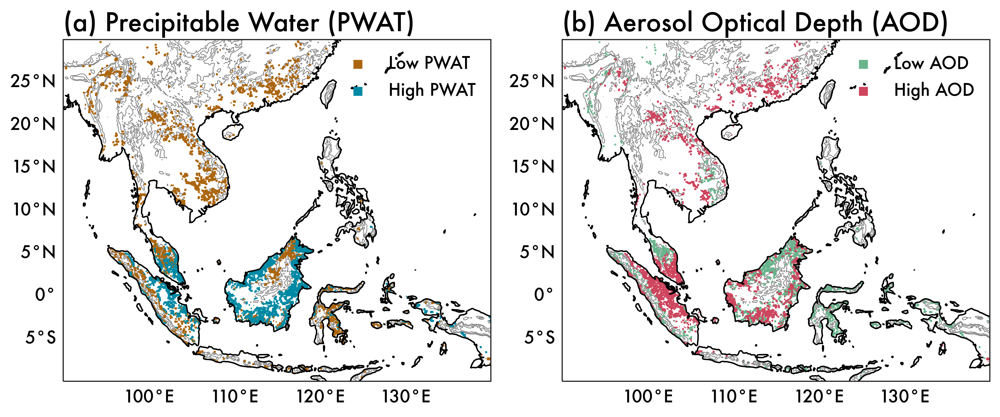

In [339]:
name = 'terra_day'

fig, axes = plt.subplots(1,2,
                    figsize=(10,5),
                    subplot_kw={'projection':ccrs.PlateCarree()},
                    sharex=True,sharey=True)

for ax, svar,cols,labs in zip(axes, ['pwat_10km','aod_10km'],
                        [['#ac660f','#0089a4'],['#69b58d', '#ce455e']],
                        [['Low PWAT','High PWAT'],['Low AOD','High AOD']]):
    alldf = pd.read_parquet(f"{dataPath}{name}.pq",
                        columns=[svar, 'year'])

    low = alldf[alldf[svar]<=alldf[svar].quantile(0.25)]
    low = low.reset_index(names=['lat','lon'])

    high = alldf[alldf[svar]>=alldf[svar].quantile(0.75)]
    high = high.reset_index(names=['lat','lon'])

    for col, df,lab in zip(cols, [low,high],labs):
        ax.scatter(df.lon,df.lat,marker='s',s=0.4,linewidths=0,color=col,label=lab)

    ax.coastlines()

    ax.contour(elev.lon,elev.lat,elev.elevation,
                levels=[500,1000,2000],colors='gray',
                linewidths=0.5,zorder=0)

    
        
    ax.set_xlim(90,140)
    ax.set_ylim(-10,30)

    add_latlon(ax)
    ax.legend(markerscale=10,loc='upper right')

axes[0].set_title('(a) Precipitable Water (PWAT)')
axes[1].set_title('(b) Aerosol Optical Depth (AOD)')

plt.savefig(f"{figPath}/supp1_quartiledefinitions.png",dpi=400, bbox_inches='tight')
plt.show('all')
plt.close('all')
